# Variance Experiment Analysis on Turbulence Data
**MGD vs Regularised (Guth method) theta estimators**

Loads a `.npz` produced by `run_variance_experiment.py` and does:
1. Basic metadata + shape check
2. Per-component mean θ at t=1
3. Variance / ‖θ‖ ratio (relative variance)
4. Trajectory plots with ±1 std shading
5. Per-component variance bar chart at t=1
6. Variance reduction ratio: MGD / smooth
7. Heatmap of variance over (time, component)
8. Optional: per-trial spaghetti plots

In [9]:
! pwd

/lustre/fswork/projects/rech/wbg/ukv59en/MGD-for-Maximum-Entropy-Generation/turbulence


In [10]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from IPython.display import display
import pandas as pd

# ── config ────────────────────────────────────────────────────────────────────
NPZ_PATH = Path(
    'saved_results/variance_turb_thetaREG_experiment/variance_bm_scales2_J8_Q1_sigma1.0_n1_2000_nt10000_K50_lam2e-05_nsub100_termsSecond,-Fourth_Real_Q1__variance_results.npz'
)

# Set to None to auto-detect from filename, or override manually
J = 3   # number of wavelet scales — used to split components by order

FIGSIZE_WIDE = (14, 5)
FIGSIZE_TALL = (12, 4)   # per-component row height
DPI          = 130
SAVE_FIGS    = False     # set True to also write PNGs to FIG_DIR
FIG_DIR      = Path('figures')
FIG_DIR.mkdir(exist_ok=True)

# Two estimators now: raw MGD theta_t, and the regularized Theta_reg
# (Florentin's regularised_theta post-processing). They live on different
# time grids — t_mgd has length nt (the full SDE schedule), t_reg has length
# n_subsample (a normalized [0,1] axis, see variance_BM.py NOTE 2) — so any
# plot that overlays both must keep that in mind (see comments below).
COLORS = dict(mgd='steelblue', reg='tomato')
LABELS = dict(mgd='MGD (raw)', reg='Regularized')
ESTIMATORS = ['mgd', 'reg']  # iteration order used throughout


def savefig(fig, name):
    if SAVE_FIGS:
        p = FIG_DIR / f'{name}.png'
        fig.savefig(p, dpi=DPI, bbox_inches='tight')
        print(f'  -> saved {p}')
    plt.show()
    plt.close(fig)


## 1 — Load & inspect

In [11]:
data = np.load(NPZ_PATH)
print('Keys:', list(data.keys()))

# time axes — different lengths for the two estimators
t_mgd = data['t_mgd']   # (T_mgd,)
t_reg = data['t_reg']   # (T_reg,)

K           = int(data['K'])
sigma       = float(data['sigma'])
lam         = float(data['lam'])
n_subsample = int(data['n_subsample'])

# per-trial trajectories  (K, T, r)
theta_mgd = data['theta_mgd']
theta_reg = data['theta_reg']

# statistics  (T, r)
mean_mgd = data['mean_mgd']
mean_reg = data['mean_reg']
var_mgd  = data['var_mgd']
var_reg  = data['var_reg']

T_mgd, r = mean_mgd.shape
T_reg, r_reg = mean_reg.shape
assert r == r_reg, f'component count mismatch between estimators: {r} vs {r_reg}'

TIME_AXES = dict(mgd=t_mgd, reg=t_reg)
MEANS     = dict(mgd=mean_mgd, reg=mean_reg)
VARS      = dict(mgd=var_mgd, reg=var_reg)
TRIALS    = dict(mgd=theta_mgd, reg=theta_reg)

# ── try to parse J from filename ──────────────────────────────────────────────
if J is None:
    import re
    m = re.search(r'_J(\d+)_', NPZ_PATH.name)
    J = int(m.group(1)) if m else None
    print(f'Auto-detected J = {J}')

# component groups (adapt if your indexing differs) — same for both
# estimators since r (the component dimension) doesn't change with the
# estimator, only the time axis does.
if J is not None:
    idx_first  = np.arange(0, J)
    idx_second = np.arange(J, J + (J + 1))
    idx_fourth = np.arange(J + (J + 1), J + (J + 1) + (J + 1))
    ORDER_GROUPS = {'1st': idx_first, '2nd': idx_second, '4th': idx_fourth}
    ORDER_COLORS = {'1st': 'tab:blue', '2nd': 'tab:red', '4th': 'tab:green'}
else:
    ORDER_GROUPS = {}
    print('J not available — order-split plots will be skipped')

print(f'\nShapes  t_mgd:{t_mgd.shape}  t_reg:{t_reg.shape}  theta_mgd:{theta_mgd.shape}  theta_reg:{theta_reg.shape}')
print(f'K={K}  T_mgd={T_mgd}  T_reg={T_reg}  r={r}  sigma={sigma}  lam={lam}  n_subsample={n_subsample}')
print(f'MGD time range: [{t_mgd[0]:.3f}, {t_mgd[-1]:.3f}]   Regularized time range: [{t_reg[0]:.3f}, {t_reg[-1]:.3f}]')


Keys: ['K', 'sigma', 'lam', 'n_subsample', 't_mgd', 't_reg', 'theta_mgd', 'theta_reg', 'var_mgd', 'var_reg', 'mean_mgd', 'mean_reg']

Shapes  t_mgd:(9999,)  t_reg:(98,)  theta_mgd:(50, 9999, 84)  theta_reg:(50, 98, 84)
K=50  T_mgd=9999  T_reg=98  r=84  sigma=1.0  lam=2e-05  n_subsample=100
MGD time range: [0.000, 1.000]   Regularized time range: [0.000, 1.000]


## 2 — Mean θ at t = 1 (final estimate)
- Check signs: negative where they should be?
- Do estimators agree on the mean values?
- Look at mean of should-be-zero thetas

In [12]:
# ── per-component summary at each estimator's final time step ────────────────
rows = []
for i in range(r):
    order = 'other'
    if J is not None:
        if i in idx_first:    order = '1st'
        elif i in idx_second:  order = '2nd'
        elif i in idx_fourth:  order = '4th'
    rows.append({
        'comp':       i,
        'order':      order,
        'mean_mgd':   mean_mgd[-1, i],
        'mean_reg':   mean_reg[-1, i],
        'std_mgd':    np.sqrt(var_mgd[-1, i]),
        'std_reg':    np.sqrt(var_reg[-1, i]),
    })

df = pd.DataFrame(rows).set_index('comp')
display(df.round(6))

,order,mean_mgd,mean_reg,std_mgd,std_reg
comp,,,,,
0,1st,19783.556641,24178.560547,9209.530273,3436.242188
1,1st,7975.002930,10295.004883,9526.656250,2742.354004
2,1st,4851.972656,3164.409180,9420.032227,2030.239502
3,2nd,-27880.976562,-15341.706055,10993.126953,5104.369629
4,2nd,64833.828125,64577.710938,4124.377930,1284.166504
...,...,...,...,...,...
79,other,62.473915,-31.503822,521.956177,138.780762
80,other,-2843.971680,516.837524,51486.058594,5131.519531
81,other,910.695312,410.418579,511.165924,104.430061


## 3 — Variance / ‖θ‖ (relative variance)
- cross-scale comparability — tells you if some scales are fundamentally harder to estimate than others, and quantifies the reduction factor

In [13]:
eps = 1e-12  # avoid 0/0


def rel_var(var, mean):
    """Var[theta] / theta^2 — element-wise relative variance."""
    return var / (mean**2 + eps)


rv_mgd = rel_var(var_mgd[-1], mean_mgd[-1])
rv_reg = rel_var(var_reg[-1], mean_reg[-1])

df_rv = pd.DataFrame({
    'order':           df['order'],
    'relvar_mgd':      rv_mgd,
    'relvar_reg':       rv_reg,
    'ratio_mgd/reg':    rv_mgd / (rv_reg + eps),
})

print('Relative variance  Var[theta] / theta^2  at each estimator\'s final time step')
display(df_rv.round(4))

print('\nAggregate (geometric mean of relative variance across components):')
for key, arr in [('MGD', rv_mgd), ('Regularized', rv_reg)]:
    gm = np.exp(np.mean(np.log(arr + eps)))
    print(f'  {key:12s}: {gm:.4e}')


Relative variance  Var[theta] / theta^2  at each estimator's final time step


,order,relvar_mgd,relvar_reg,ratio_mgd/reg
comp,,,,
0,1st,0.216700,0.020200,10.729000
1,1st,1.427000,0.071000,20.110600
2,1st,3.769400,0.411600,9.157100
3,2nd,0.155500,0.110700,1.404400
4,2nd,0.004000,0.000400,10.233800
...,...,...,...,...
79,other,69.802399,19.405800,3.597000
80,other,327.739502,98.578903,3.324600
81,other,0.315000,0.064700,4.866100



Aggregate (geometric mean of relative variance across components):
  MGD         : 2.6628e+00
  Regularized : 2.7765e-01


## 4 — Trajectory plots with ±1 std shading

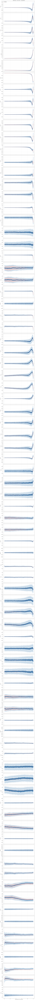

In [15]:
# ── trajectory plots with +/-1 std shading ────────────────────────────────────
def plot_trajectories(components, title_suffix=''):
    """Overlay MGD and Regularized mean +/- std for each component.
    Each estimator is plotted against its own time axis (t_mgd / t_reg)."""
    n = len(components)
    fig, axes = plt.subplots(n, 1, figsize=(12, FIGSIZE_TALL[1] * n), sharex=True)
    if n == 1:
        axes = [axes]

    for ax, i in zip(axes, components):
        for key in ESTIMATORS:
            t = TIME_AXES[key]
            mean = MEANS[key]
            std = np.sqrt(VARS[key][:, i])
            ax.plot(t, mean[:, i], color=COLORS[key], label=LABELS[key], lw=1.5)
            ax.fill_between(t, mean[:, i] - std, mean[:, i] + std,
                             color=COLORS[key], alpha=0.18)

        ax.set_ylabel(f'theta[{i}]', fontsize=9)
        ax.axhline(0, color='k', lw=0.5, ls='--')
        ax.grid(True, alpha=0.3)

    axes[0].legend(fontsize=9)
    axes[0].set_title(f'Mean theta +/- 1 std  (K={K})  {title_suffix}')
    axes[-1].set_xlabel('t  (each estimator on its own time axis)')
    fig.tight_layout()
    return fig


# All components (can be long if r is large — reduce slice if needed)
fig = plot_trajectories(range(r), title_suffix='— all components')
savefig(fig, 'theta_trajectories_all')


## 5 — Per-component variance bar chart at t = 1
- how big is the variance? is the estimator reliable?

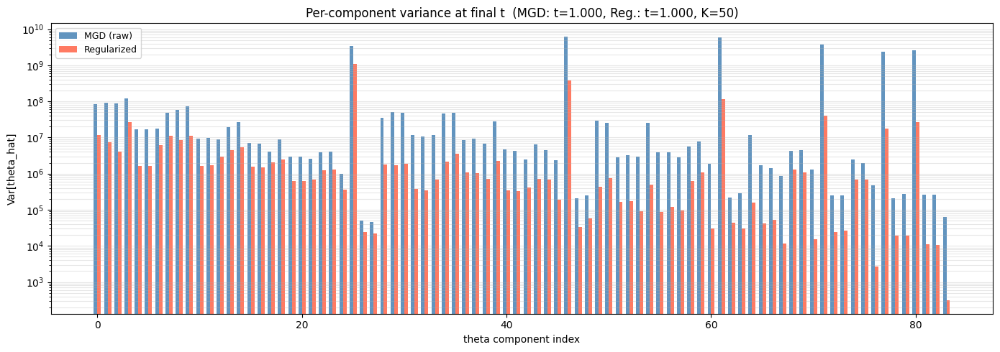

In [16]:
# ── per-component variance bar plot at each estimator's final time step ──────
fig, ax = plt.subplots(figsize=FIGSIZE_WIDE)

x = np.arange(r)
w = 0.35
ax.bar(x - w / 2, var_mgd[-1], width=w, label=LABELS['mgd'], color=COLORS['mgd'], alpha=0.85)
ax.bar(x + w / 2, var_reg[-1], width=w, label=LABELS['reg'], color=COLORS['reg'], alpha=0.85)

ax.set_yscale('log')
ax.set_xlabel('theta component index')
ax.set_ylabel('Var[theta_hat]')
ax.set_title(f'Per-component variance at final t  (MGD: t={t_mgd[-1]:.3f}, Reg.: t={t_reg[-1]:.3f}, K={K})')
ax.legend(fontsize=9)
ax.grid(True, axis='y', which='both', alpha=0.3)
fig.tight_layout()
savefig(fig, 'variance_barplot_final_t')



## Per component mean at t=1

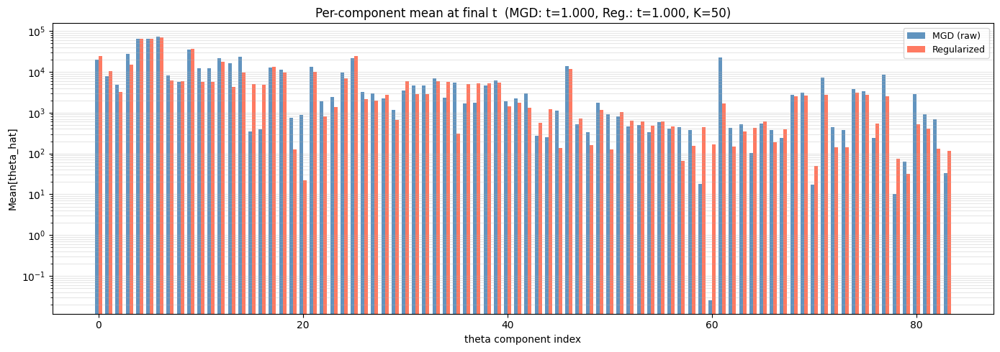

In [17]:
# ── per-component mean bar plot at each estimator's final time step ──────
fig, ax = plt.subplots(figsize=FIGSIZE_WIDE)

x = np.arange(r)
w = 0.35
ax.bar(x - w / 2, np.abs(mean_mgd[-1]), width=w, label=LABELS['mgd'], color=COLORS['mgd'], alpha=0.85)
ax.bar(x + w / 2, np.abs(mean_reg[-1]), width=w, label=LABELS['reg'], color=COLORS['reg'], alpha=0.85)

ax.set_yscale('log')
ax.set_xlabel('theta component index')
ax.set_ylabel('Mean[theta_hat]')
ax.set_title(f'Per-component mean at final t  (MGD: t={t_mgd[-1]:.3f}, Reg.: t={t_reg[-1]:.3f}, K={K})')
ax.legend(fontsize=9)
ax.grid(True, axis='y', which='both', alpha=0.3)
fig.tight_layout()
savefig(fig, 'mean_barplot_final_t')



## Noise to signal ratio at t=1

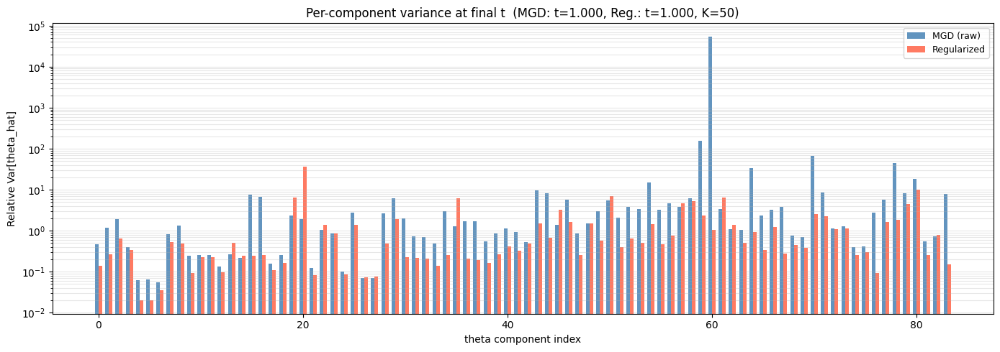

In [18]:
# ── per-component variance bar plot at each estimator's final time step ──────
fig, ax = plt.subplots(figsize=FIGSIZE_WIDE)

x = np.arange(r)
w = 0.35
ax.bar(x - w / 2, np.sqrt(var_mgd[-1]) / (np.abs(mean_mgd[-1])), width=w, label=LABELS['mgd'], color=COLORS['mgd'], alpha=0.85)
ax.bar(x + w / 2, np.sqrt(var_reg[-1])/np.abs(mean_reg[-1]), width=w, label=LABELS['reg'], color=COLORS['reg'], alpha=0.85)

ax.set_yscale('log')
ax.set_xlabel('theta component index')
ax.set_ylabel('Relative Var[theta_hat]')
ax.set_title(f'Per-component noise to signal at final t  (MGD: t={t_mgd[-1]:.3f}, Reg.: t={t_reg[-1]:.3f}, K={K})')
ax.legend(fontsize=9)
ax.grid(True, axis='y', which='both', alpha=0.3)
fig.tight_layout()
savefig(fig, 'rel_variance_barplot_final_t')



## 6 — Total variance over time + variance reduction ratio

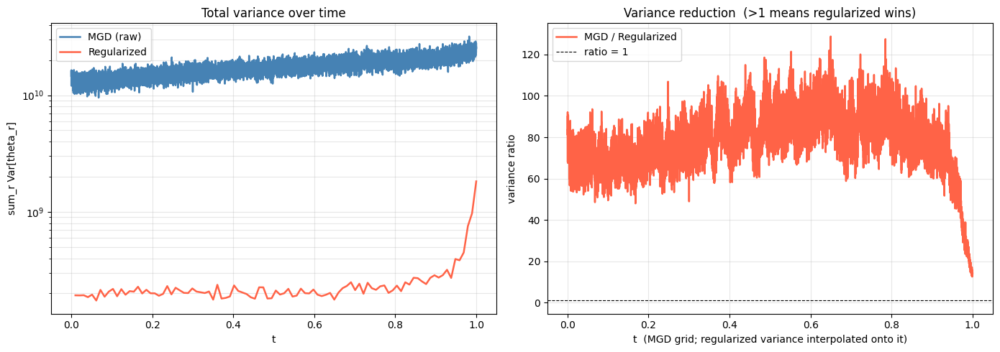

In [19]:

# ── total variance over time + variance ratio ─────────────────────────────────
# var_mgd and var_reg live on different time grids, so the ratio needs the
# regularized variance interpolated onto the MGD grid (both axes are
# monotonic and span a comparable [t_min, t_max] range).
fig, axes = plt.subplots(1, 2, figsize=FIGSIZE_WIDE)

ax = axes[0]
ax.semilogy(t_mgd[1:], var_mgd[1:].sum(1), label=LABELS['mgd'], color=COLORS['mgd'], lw=1.8)
ax.semilogy(t_reg[1:], var_reg[1:].sum(1), label=LABELS['reg'], color=COLORS['reg'], lw=1.8)
ax.set_xlabel('t')
ax.set_ylabel('sum_r Var[theta_r]')
ax.set_title('Total variance over time')
ax.legend()
ax.grid(True, which='both', alpha=0.3)

ax = axes[1]
var_reg_total_interp = np.interp(t_mgd, t_reg, var_reg.sum(1))
ratio = var_mgd.sum(1) / (var_reg_total_interp + 1e-30)
ax.plot(t_mgd[1:], ratio[1:], label='MGD / Regularized', color=COLORS['reg'], lw=1.8)
ax.axhline(1, color='k', lw=0.8, ls='--', label='ratio = 1')
ax.set_xlabel('t  (MGD grid; regularized variance interpolated onto it)')
ax.set_ylabel('variance ratio')
ax.set_title('Variance reduction  (>1 means regularized wins)')
ax.legend()
ax.grid(True, alpha=0.3)

fig.tight_layout()
savefig(fig, 'variance_total_and_ratio')